# <center> CIMAT - INEGI: Sesión de Dudas I <center>
<center> Maestría en Análisis Estadístico y Computación <center>
<center> Profesores: Dr. Johan Van Horebeek y Dr. Víctor Muñiz Sánchez <center>
<center> Ayudante: Gabriel Alejandro Aguilar Farrera <center>

In [1]:
# Cargamos las librerías necesarias
import pandas as pd              # Cargar y manipular datos (..xlsx o .csv)
import matplotlib.pyplot as plt  # Visualización de datos
import numpy as np               # Manipulación de matrices y cálculos en general
import seaborn as sns            # Visualización de datos

from sklearn.preprocessing import StandardScaler   # Estandarizar los datos
from pandas.plotting import parallel_coordinates   #  Gráfico de coordenadas paralelas (técnica de visualización útil para explorar y comparar múltiples variables en un conjunto de datos)

from IPython.display import Image, display         # Imágenes
from sklearn.preprocessing import LabelEncoder

%config InlineBackend.figure_format = 'retina'     # Mejorar calidad de los gráficos/imágenes

Los datos que se encuentran en el archivo IMM 2020.xls corresponden al índice de marginación (IM) por cada municipio del país, calculado por el consejo nacional de población (CONAPO) en 2020, y es hasta
la fecha, el más reciente. El archivo contiene también los valores de varios indicadores que representan nueve formas de exclusión de la marginación en las dimensiones: educación, vivienda, distribución de la
poblaci´on e ingresos monetarios, y fueron construidos en base a la información del censo de población y vivienda 2020 realizado por INEGI. Estos indicadores se usan para calcular el IM según se describe en la
Nota técnico-metodológica.

1. a) Realiza un análisis de **PCA, ISOMAP, t-SNE, y Local Linear Embedding (LLE)** basado en los 9 indicadores de CONAPO. ¿Qué puedes decir respecto al fenómeno de marginación en el país basado en éste análisis? ¿Encuentras algún patrón interesante respecto a  los municipios? El resultado de éste inciso debe ser un reporte breve y claro con tus hallazgos y/o conclusiones, usando las ilustraciones que creas apropiadas.

In [2]:
# Nombre del archivo
path = "IMM_2020_1.CSV"

In [3]:
# Cargar los datos
data = pd.read_csv(path)

In [4]:
# Mostrar primeros 5 elementos
data.head(5)

,CVE_ENT,NOM_ENT,CVE_MUN,NOM_MUN,POB_TOT,ANALF,SBASC,OVSDE,OVSEE,OVSAE,OVPT,VHAC,PL.5000,PO2SM,IM_2020,GM_2020,IMN_2020
0,1,Aguascalientes,1001,Aguascalientes,948990,1.644738,20.367220,0.104799,0.113169,0.378610,0.591434,10.339530,7.523683,54.226594,60.318795,Muy bajo,0.944508
1,1,Aguascalientes,1002,Asientos,51536,3.526405,33.906364,2.650373,0.486448,0.858160,1.352430,22.942305,78.221049,78.565471,56.546071,Muy bajo,0.885433
2,1,Aguascalientes,1003,Calvillo,58250,4.491509,42.482450,0.365177,0.516760,0.800978,1.040411,19.219858,51.301288,79.259777,57.058251,Muy bajo,0.893453
3,1,Aguascalientes,1004,Cosío,17000,3.144867,27.696745,0.712855,0.577354,0.659833,1.030989,22.716866,65.470588,81.726369,57.114030,Muy bajo,0.894326
4,1,Aguascalientes,1005,Jesús María,129929,2.380588,26.692477,0.277034,0.354957,0.860426,1.312652,16.404575,37.164143,56.748753,59.011762,Muy bajo,0.924042


In [5]:
# Mostrar últimos 5 elementos
data.tail(5)

,CVE_ENT,NOM_ENT,CVE_MUN,NOM_MUN,POB_TOT,ANALF,SBASC,OVSDE,OVSEE,OVSAE,OVPT,VHAC,PL.5000,PO2SM,IM_2020,GM_2020,IMN_2020
2464,32,Zacatecas,32054,Villa Hidalgo,19446,7.497894,36.678176,3.010808,0.452908,2.254246,1.137416,21.932484,100.000000,90.877128,55.044146,Bajo,0.861915
2465,32,Zacatecas,32055,Villanueva,31558,4.199744,44.806459,2.536486,0.551254,1.073864,0.895418,15.269627,56.774827,81.912592,56.747058,Muy bajo,0.888580
2466,32,Zacatecas,32056,Zacatecas,149607,1.442438,19.436229,0.294739,0.163292,1.278559,0.484463,9.340958,7.461549,57.885307,60.176191,Muy bajo,0.942275
2467,32,Zacatecas,32057,Trancoso,20455,5.119108,31.992586,3.066130,0.500392,2.860086,1.344192,23.544577,16.788071,83.056133,56.958073,Muy bajo,0.891884
2468,32,Zacatecas,32058,Santa María de la Paz,2767,5.626223,44.226179,1.087745,0.471356,0.507614,1.667875,17.948717,100.000000,79.013906,56.055803,Bajo,0.877756


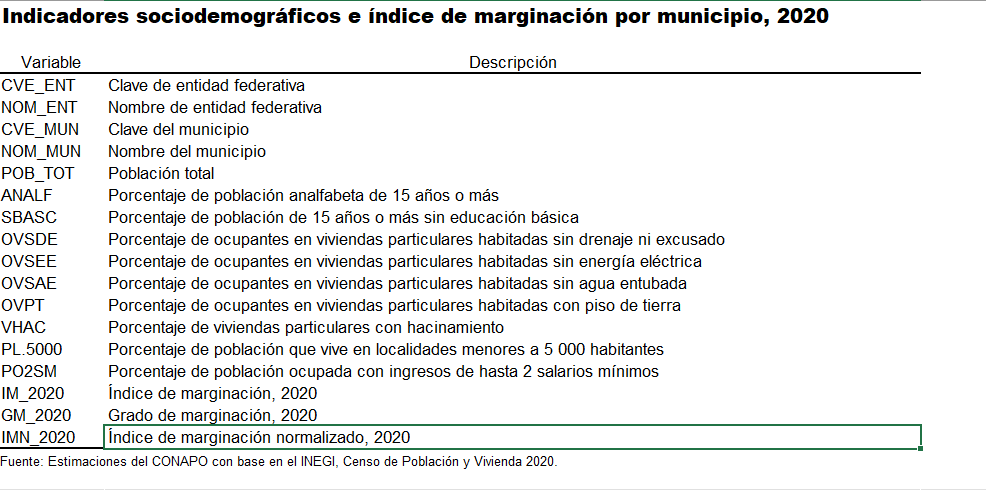

In [6]:
# Ruta de la imagen
imagen_path = 'indicadores.png'
# Mostrar la imagen
display(Image(filename=imagen_path))

In [7]:
# Lista de los 9 índices
indices = ['ANALF', 'SBASC', 'OVSDE', 'OVSEE', 'OVSAE', 'OVPT',  'VHAC', 'PL.5000', 'PO2SM']

In [8]:
# Base de datos con los 9 índices de marginación
data2 = data[indices]

In [9]:
# Mostrar datos
data2.head(5)

,ANALF,SBASC,OVSDE,OVSEE,OVSAE,OVPT,VHAC,PL.5000,PO2SM
0,1.644738,20.367220,0.104799,0.113169,0.378610,0.591434,10.339530,7.523683,54.226594
1,3.526405,33.906364,2.650373,0.486448,0.858160,1.352430,22.942305,78.221049,78.565471
2,4.491509,42.482450,0.365177,0.516760,0.800978,1.040411,19.219858,51.301288,79.259777
3,3.144867,27.696745,0.712855,0.577354,0.659833,1.030989,22.716866,65.470588,81.726369
4,2.380588,26.692477,0.277034,0.354957,0.860426,1.312652,16.404575,37.164143,56.748753


In [10]:
# Normalizar datos
data3 = (data2 - data2.min()) / (data2.max() - data2.min())
data_norm = pd.concat([data3, data[['NOM_ENT']]], axis = 1)
data_norm.head(10)

,ANALF,SBASC,OVSDE,OVSEE,OVSAE,OVPT,VHAC,PL.5000,PO2SM,NOM_ENT
0,0.024494,0.179147,0.001626,0.002133,0.004629,0.008678,0.097375,0.075237,0.360232,Aguascalientes
1,0.060188,0.342677,0.041123,0.009167,0.010492,0.019845,0.289451,0.782210,0.700413,Aguascalientes
2,0.078495,0.446262,0.005666,0.009738,0.009793,0.015267,0.232718,0.513013,0.710117,Aguascalientes
3,0.052950,0.267675,0.011061,0.010880,0.008068,0.015128,0.286015,0.654706,0.744592,Aguascalientes
4,0.038453,0.255545,0.004298,0.006689,0.010520,0.019261,0.189811,0.371641,0.395484,Aguascalientes
5,0.045125,0.243851,0.008399,0.008018,0.012774,0.010354,0.230525,0.327646,0.501516,Aguascalientes
6,0.058661,0.260399,0.014986,0.009448,0.012560,0.019115,0.259475,0.442852,0.673556,Aguascalientes
7,0.039575,0.276410,0.032694,0.017385,0.020893,0.012614,0.268578,0.413003,0.656322,Aguascalientes
8,0.073633,0.356928,0.021490,0.011030,0.013274,0.020979,0.290113,0.767623,0.677744,Aguascalientes
9,0.067244,0.352960,0.036014,0.019420,0.021780,0.021314,0.272297,0.697550,0.669253,Aguascalientes


<AxesSubplot:xlabel='NOM_ENT', ylabel='count'>

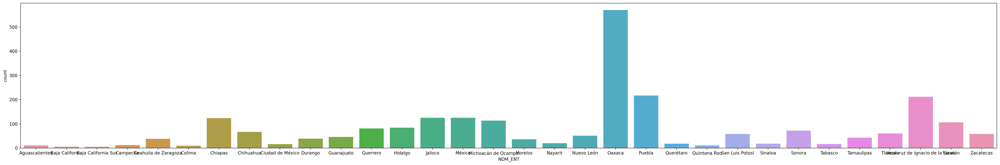

In [11]:
# ¿Desbalanceo de clases?
f, ax = plt.subplots(figsize=(40, 6))
sns.countplot(data = data_norm, x = 'NOM_ENT', orient="h")

<AxesSubplot:xlabel='ANALF', ylabel='NOM_ENT'>

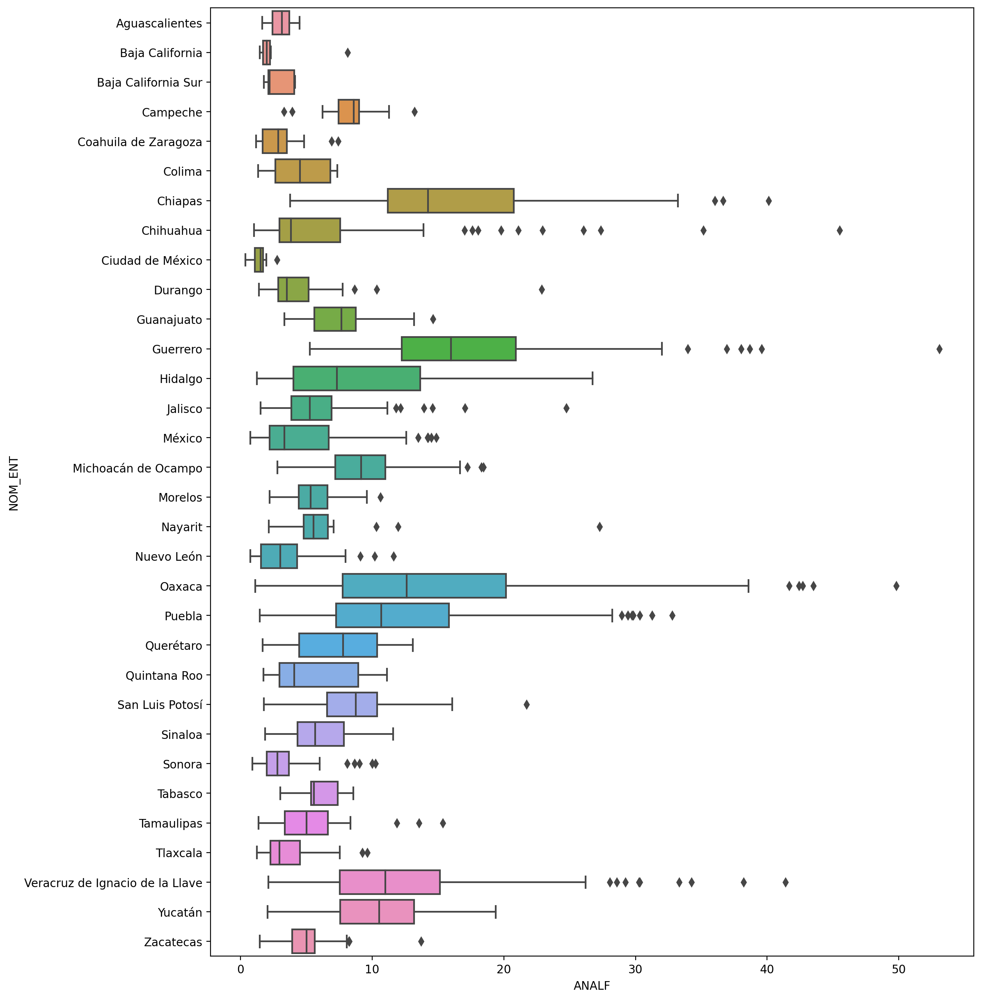

In [12]:
# Distribución de los datos
f, ax = plt.subplots(figsize=(12, 15))
sns.boxplot(data=data, orient="h", y = "NOM_ENT", x = "ANALF")

<AxesSubplot:xlabel='IMN_2020', ylabel='NOM_ENT'>

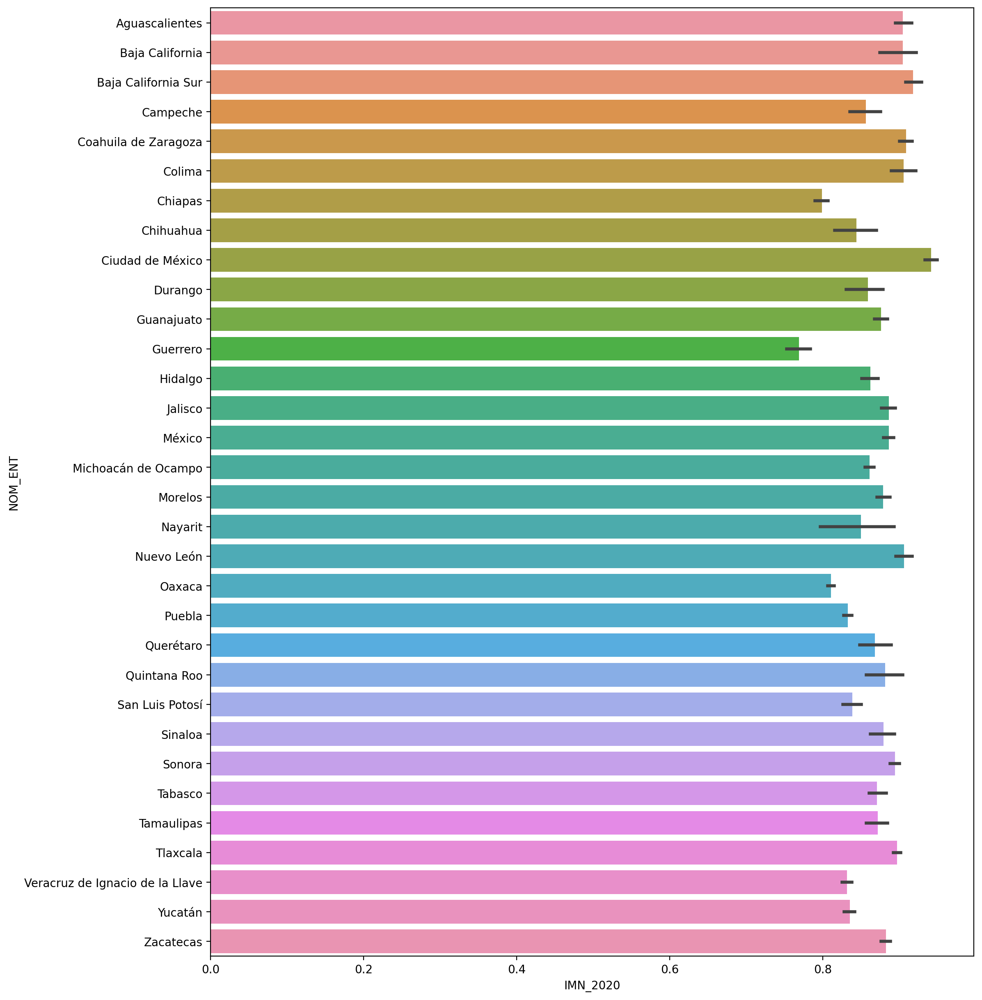

In [13]:
# IMN_2020 en los distintos Estados
f, ax = plt.subplots(figsize=(12, 15))
sns.barplot(data=data, orient="h", y = "NOM_ENT", x = "IMN_2020")

<AxesSubplot:>

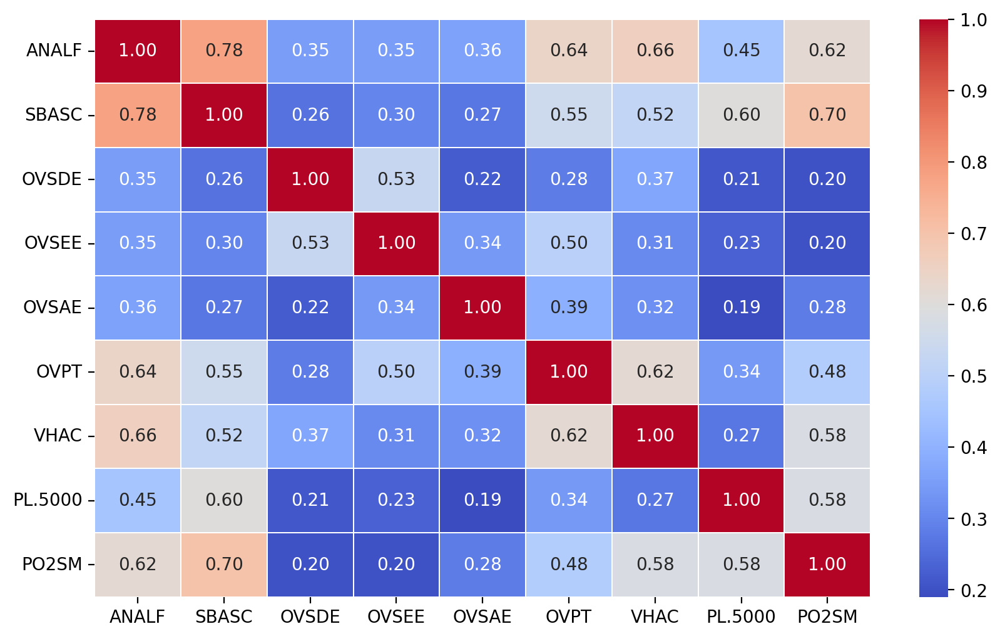

In [14]:
# Mapa de calor de la matriz de correlación
f, ax = plt.subplots(figsize=(10, 6))
CorrData2 = data2.corr()
sns.heatmap(round(CorrData2,2), annot=True, ax=ax, cmap="coolwarm",fmt='.2f', linewidths=.05)

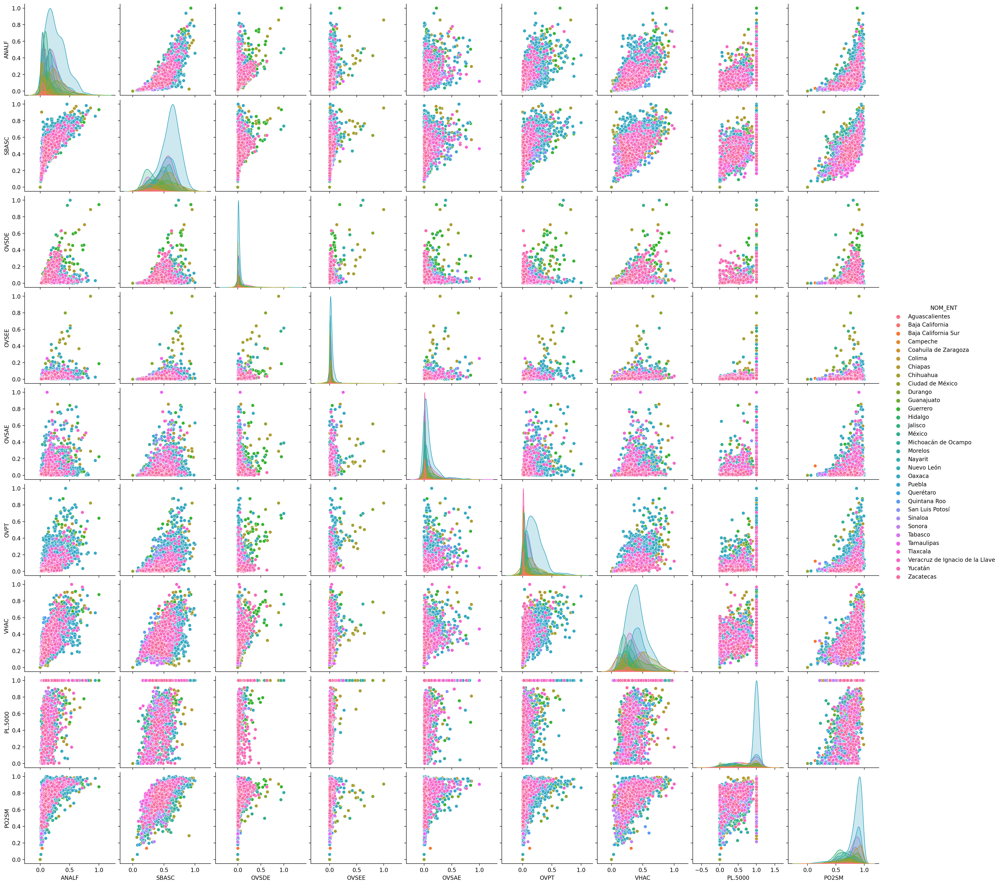

In [15]:
# Pairplot: Todos vs todos
sns.pairplot(data = data_norm, hue = 'NOM_ENT')

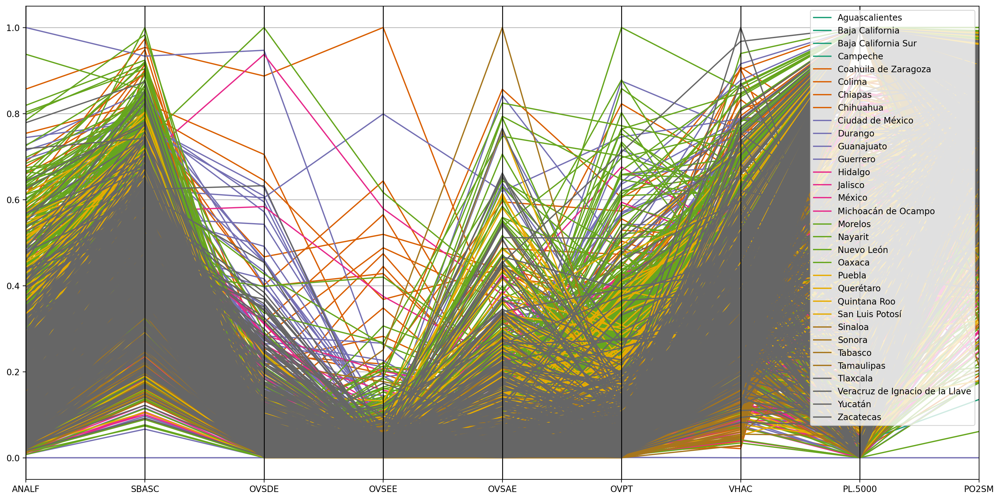

In [16]:
# Coordenadas paralelas
f, ax = plt.subplots(figsize=(20, 10))
pc = parallel_coordinates(frame = data_norm, class_column = 'NOM_ENT',colormap=plt.get_cmap("Dark2"))

# Comentarios
* ¿Qué hacen estos métodos (PCA, t-SNE, LLE y ISOMAP)?
Toman datos en alta dimensión (maldición de la dimensionalidad) y lo reducen a un gráfica de baja dimnesión que capta la mayor parte de la información.

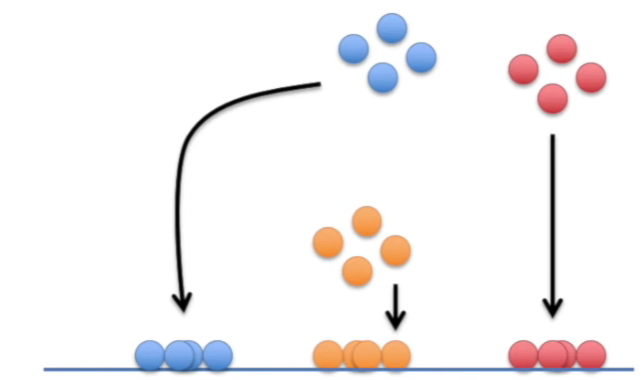

In [17]:
# Ruta de la imagen
imagen_path_2 = 'ajemplo.png'
# Mostrar la imagen
display(Image(filename=imagen_path_2))

# Parte 1: PCA

In [18]:
# Estandarizando los datos
media = data2.mean()
std = data2.std()

# Datos estandarizados
data_std_1 = (data2 - media) / (std)

data_std = pd.concat([data_std_1, data[['NOM_ENT']]], axis = 1)

In [19]:
# Datos estandarizados
data_std.head(5)

,ANALF,SBASC,OVSDE,OVSEE,OVSAE,OVPT,VHAC,PL.5000,PO2SM,NOM_ENT
0,-1.116078,-1.822811,-0.577612,-0.501098,-0.620759,-0.824174,-1.532772,-1.768665,-2.359781,Aguascalientes
1,-0.869581,-0.854456,-0.096344,-0.366300,-0.568893,-0.739370,-0.342320,0.235926,-0.302472,Aguascalientes
2,-0.743153,-0.241072,-0.528385,-0.355353,-0.575078,-0.774141,-0.693940,-0.527371,-0.243784,Aguascalientes
3,-0.919562,-1.298584,-0.462653,-0.333472,-0.590343,-0.775191,-0.363615,-0.125607,-0.035289,Aguascalientes
4,-1.019682,-1.370412,-0.545049,-0.413784,-0.568648,-0.743803,-0.959871,-0.928223,-2.146589,Aguascalientes


In [20]:
# Concatenamos los índices con NOM_ENT
data2 = pd.concat([data2, data[['NOM_ENT']]], axis = 1)

In [21]:
# Datos sin normalizar
data2.head(5)

,ANALF,SBASC,OVSDE,OVSEE,OVSAE,OVPT,VHAC,PL.5000,PO2SM,NOM_ENT
0,1.644738,20.367220,0.104799,0.113169,0.378610,0.591434,10.339530,7.523683,54.226594,Aguascalientes
1,3.526405,33.906364,2.650373,0.486448,0.858160,1.352430,22.942305,78.221049,78.565471,Aguascalientes
2,4.491509,42.482450,0.365177,0.516760,0.800978,1.040411,19.219858,51.301288,79.259777,Aguascalientes
3,3.144867,27.696745,0.712855,0.577354,0.659833,1.030989,22.716866,65.470588,81.726369,Aguascalientes
4,2.380588,26.692477,0.277034,0.354957,0.860426,1.312652,16.404575,37.164143,56.748753,Aguascalientes


In [22]:
# Datos normalizados
data_norm2 = data_norm
data_norm2.head(5)

,ANALF,SBASC,OVSDE,OVSEE,OVSAE,OVPT,VHAC,PL.5000,PO2SM,NOM_ENT
0,0.024494,0.179147,0.001626,0.002133,0.004629,0.008678,0.097375,0.075237,0.360232,Aguascalientes
1,0.060188,0.342677,0.041123,0.009167,0.010492,0.019845,0.289451,0.782210,0.700413,Aguascalientes
2,0.078495,0.446262,0.005666,0.009738,0.009793,0.015267,0.232718,0.513013,0.710117,Aguascalientes
3,0.052950,0.267675,0.011061,0.010880,0.008068,0.015128,0.286015,0.654706,0.744592,Aguascalientes
4,0.038453,0.255545,0.004298,0.006689,0.010520,0.019261,0.189811,0.371641,0.395484,Aguascalientes


In [23]:
# Usamos un label encoder para NOM_ENT
label_encoder = LabelEncoder()

data_norm2['NOM_ENT'] = label_encoder.fit_transform(data_norm2['NOM_ENT'])

data2['NOM_ENT'] = label_encoder.fit_transform(data2['NOM_ENT'])

In [24]:
data_norm2.head(5)

,ANALF,SBASC,OVSDE,OVSEE,OVSAE,OVPT,VHAC,PL.5000,PO2SM,NOM_ENT
0,0.024494,0.179147,0.001626,0.002133,0.004629,0.008678,0.097375,0.075237,0.360232,0
1,0.060188,0.342677,0.041123,0.009167,0.010492,0.019845,0.289451,0.782210,0.700413,0
2,0.078495,0.446262,0.005666,0.009738,0.009793,0.015267,0.232718,0.513013,0.710117,0
3,0.052950,0.267675,0.011061,0.010880,0.008068,0.015128,0.286015,0.654706,0.744592,0
4,0.038453,0.255545,0.004298,0.006689,0.010520,0.019261,0.189811,0.371641,0.395484,0


In [25]:
data2.head(5)

,ANALF,SBASC,OVSDE,OVSEE,OVSAE,OVPT,VHAC,PL.5000,PO2SM,NOM_ENT
0,1.644738,20.367220,0.104799,0.113169,0.378610,0.591434,10.339530,7.523683,54.226594,0
1,3.526405,33.906364,2.650373,0.486448,0.858160,1.352430,22.942305,78.221049,78.565471,0
2,4.491509,42.482450,0.365177,0.516760,0.800978,1.040411,19.219858,51.301288,79.259777,0
3,3.144867,27.696745,0.712855,0.577354,0.659833,1.030989,22.716866,65.470588,81.726369,0
4,2.380588,26.692477,0.277034,0.354957,0.860426,1.312652,16.404575,37.164143,56.748753,0


In [53]:
# Importar libreria de PCA en Python
from sklearn.decomposition import PCA

In [54]:
# Inicializar PCA
pca = PCA(n_components=2)

# Ajustar los datos al constructor de PCA
# pca_res es un objeto tipo numpy
pca_res = pca.fit_transform(data_norm2[['ANALF', 'SBASC', 'OVSDE', 'OVSEE',
                                        'OVSAE', 'OVPT', 'VHAC', 'PL.5000', 'PO2SM']])

In [55]:
# Creamos un df con los componentes principales
pca_res_df = pd.DataFrame(data=pca_res, columns=['PC1', 'PC2'])

# Concatenar con NOM_ENT
pca_final = pd.concat([pca_res_df, data2[['NOM_ENT']]], axis=1)

In [56]:
pca_final.head(5)

,PC1,PC2,NOM_ENT
0,0.843716,-0.082658,0
1,0.060929,-0.218918,0
2,0.252049,-0.067552,0
3,0.180333,-0.167452,0
4,0.543118,-0.157857,0


Text(0.5, 1.0, 'PCA')

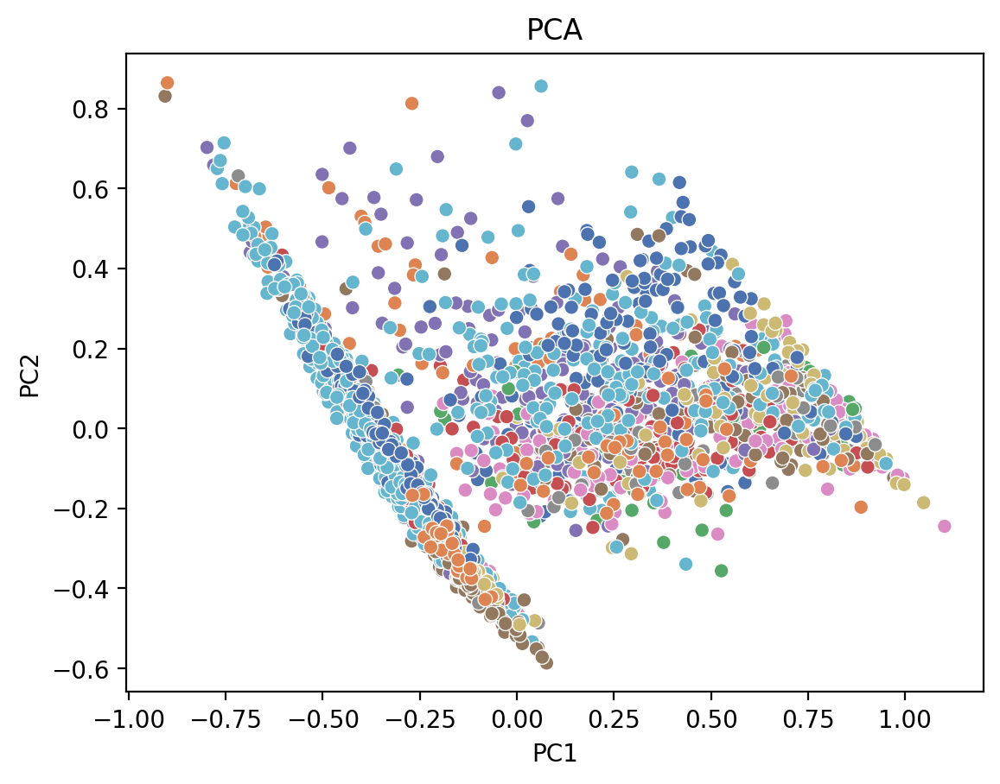

In [57]:
sns.scatterplot(data=pca_final, x="PC1", y="PC2", hue="NOM_ENT", palette="deep", legend = False)
plt.title('PCA')

# Parte 2: ISOMAP

Consideremos aplicar el Análisis de Componentes Principales (PCA) a los datos de Swissroll. ¿Dará buenos resultados?

NO. ¿Por qué?

PCA no puede capturar las dimensiones curvadas (sus direcciones principales generalmente no tienen significado).

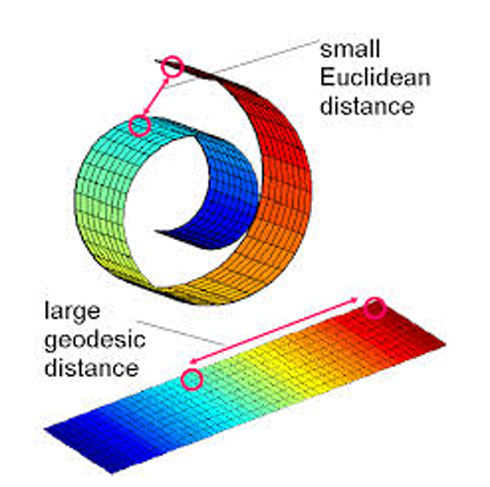

In [31]:
# Ruta de la imagen
imagen_path_4 = 'ejemplo4.png'
# Mostrar la imagen
display(Image(filename=imagen_path_4))

El enfoque de ISOmap para la reducción de dimensiones consiste en, en lugar de preservar la distancia euclidiana, aplicar el Escalamiento Multidimensional (MDS) para preservar la **distancia geodésica**. Esto captura la verdadera geometría no lineal correspondiente a la dimensión curva. Permite visualizar la transición a lo largo de la variedad (y, por lo tanto, la estructura global).

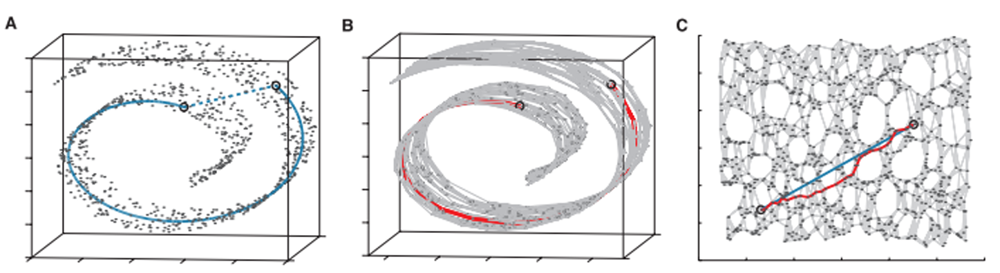

In [32]:
# Ruta de la imagen
imagen_path_5 = 'ejemplo5.png'
# Mostrar la imagen
display(Image(filename=imagen_path_5))

En entornos prácticos donde solo tenemos un conjunto de datos X muestreado de una variedad desconocida M,  podemos aproximar las verdaderas distancias geodésicasmediante las distancias de camino más corto.

Esto implica construir un grafo utilizando los puntos de datos como nodos y conectando los nodos que son vecinos más cercanos. Luego, la distancia geodésica aproximada entre dos puntos i y 
j en la variedad M se estima mediante la distancia de camino más corto en el grafo G correspondiente.

El parámetro 'n_neighbors' especifica la cantidad de vecinos a considerar para cada punto durante la construcción de los vecindarios locales. En el contexto de ISOMAP, la técnica utiliza una estructura de vecinos para aproximar la geodesia intrínseca de los datos, es decir, la distancia "real" a lo largo de la variedad subyacente.

In [58]:
from sklearn.manifold import Isomap

In [59]:
# Inicializar ISOMAP
isomap = Isomap(n_neighbors=5,
                n_components=2)

In [68]:
# Ajustar los datos al constructor de ISOMAP
isomap_res = isomap.fit_transform(data_std[['ANALF', 'SBASC', 'OVSDE', 'OVSEE',
                                         'OVSAE', 'OVPT', 'VHAC', 'PL.5000', 'PO2SM']])

In [69]:
# Crear un DataFrame con los componentes de ISOMAP
isomap_res_df = pd.DataFrame(data=isomap_res, columns=['IsoMap1', 'IsoMap2'])

In [70]:
# Concatenar con 'NOM_ENT'
isomap_final = pd.concat([isomap_res_df, data2[['NOM_ENT']]], axis=1)

Text(0.5, 1.0, 'ISOMAP')

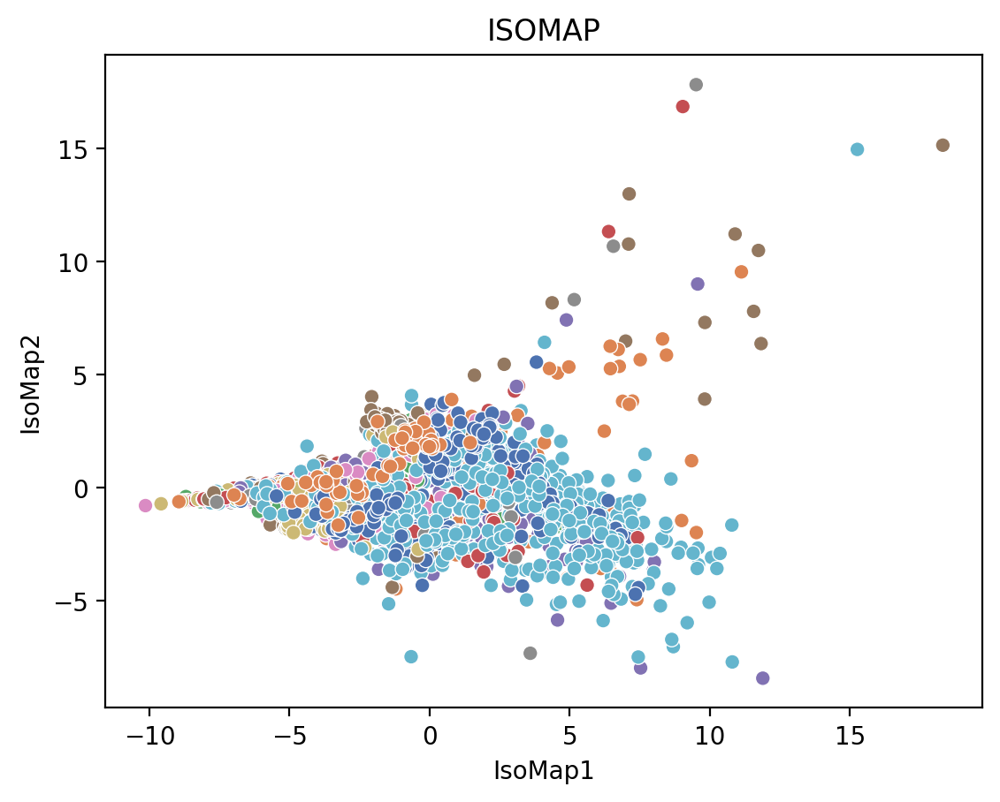

In [71]:
sns.scatterplot(data=isomap_final, x="IsoMap1", y="IsoMap2", hue="NOM_ENT", palette="deep", legend=False)
plt.title('ISOMAP')

# Parte 3: t-SNE

t-SNE mira los datos en alta dimnesión y cuando los grafica en baja dimensión los va agrupando de manera que los puntos del mismo grupo en alta dimnesión se atraigan con más fuerza en baja dimensión. Análogamente, los puntos que están lejos se repelen.

* Step 1: Determina la similaridad entre todos los puntos del scatter plot.

* Step 2: Traza una distancia entre el punto de interés (A) y otro punto (B) y esa distancia la traza en una curna normal centrada en el punto de interés.

* Step 3: Traza una línea del punto B a la curva normal. Esta distancia es la 'similitud sin escala'.

* Step 4: Este proceso se repite con todos los puntos. Usar una dist. normal significa que puntos distantes tienen similaridades bajas. Por otro lado, puntos cercanos tienen similitudes altas. Medimos las similaridades entre todos los puntos y el punto de interés.

* Step 5: Sumar las similaridades sin escala para que sumen 1: Score/ Sum all scores = Scales Scores. Al final para cada punto de interés tendremos una dist. normal diferente.

Los puntos en el diagrama de dispersión de baja dimensión se van a grupando en base a sus similaridades. Sólo que las similaridades se calculan usando una distribución t, no una dist. normal. Ambas curvas se parecen. Sólo que  la dis. t no es tan alta en el punto ás alto y tiene colas más altas.

t-SNE tiene un parámertro de perplejidad que es igual a la densidad esperada al rededor de cada punto.

La perplejidad puede entenderse como una medida de la cantidad de entropía en la distribución de vecinos alrededor de un punto en el espacio original. Un valor bajo de perplejidad hará que el algoritmo se centre en vecinos cercanos, mientras que un valor alto permitirá que se consideren vecinos más distantes. 

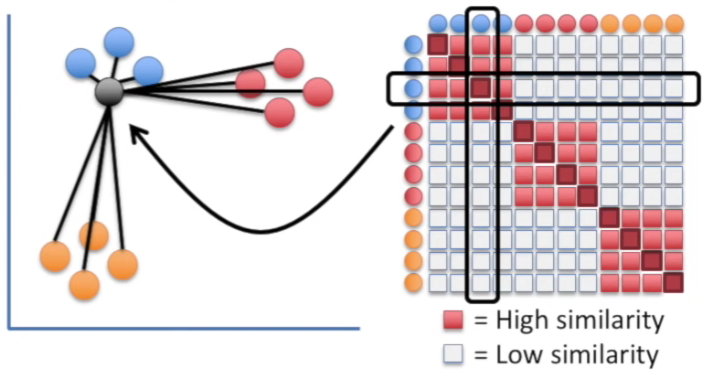

In [39]:
# Ruta de la imagen
imagen_path_3 = 'ejemplo3.png'
# Mostrar la imagen
display(Image(filename=imagen_path_3))

In [72]:
from sklearn.manifold import TSNE

In [73]:
# Inicializar T-SNE
tsne = TSNE(n_components=2,
            perplexity=30,
            n_iter=300)

In [78]:
# Ajustar los datos al constructor de T-SNE
tsne_res = tsne.fit_transform(data_std[['ANALF', 'SBASC', 'OVSDE', 'OVSEE',
                                     'OVSAE', 'OVPT', 'VHAC', 'PL.5000', 'PO2SM']])

In [79]:
# Crear un DataFrame con los componentes de T-SNE
tsne_res_df = pd.DataFrame(data=tsne_res, columns=['TSNE1', 'TSNE2'])

In [80]:
# Concatenar con 'NOM_ENT'
tsne_final = pd.concat([tsne_res_df, data2[['NOM_ENT']]], axis=1)

Text(0.5, 1.0, 'T-SNE')

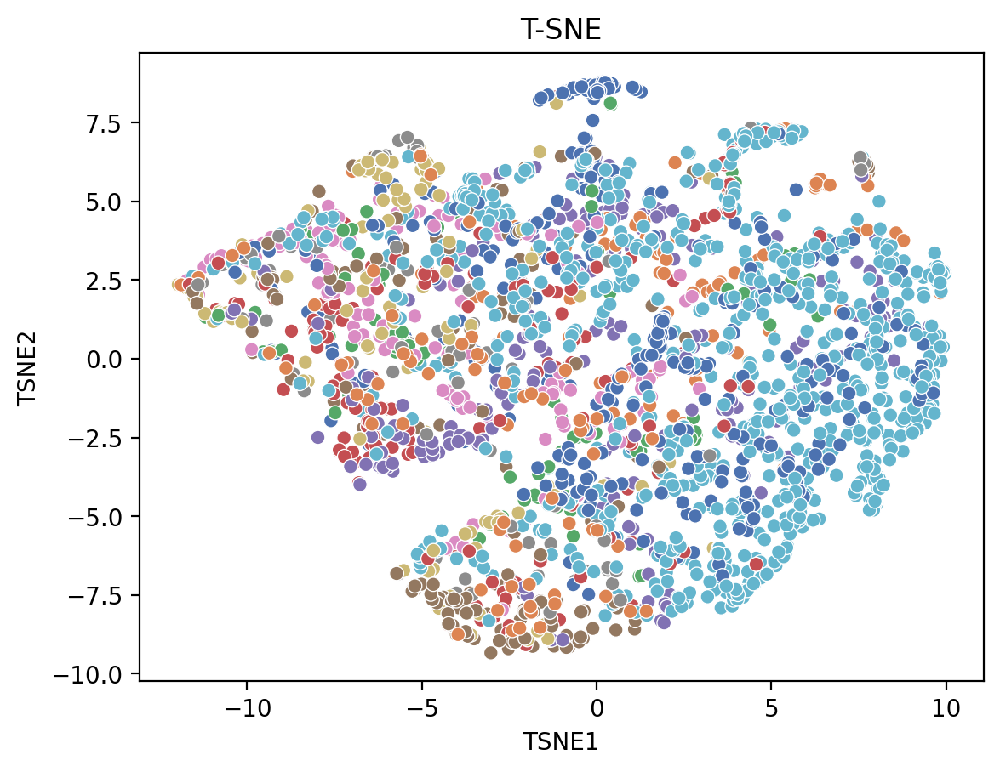

In [81]:
sns.scatterplot(data=tsne_final, x="TSNE1", y="TSNE2", hue="NOM_ENT", palette="deep", legend=False)
plt.title('T-SNE')

# Parte 4: LLE

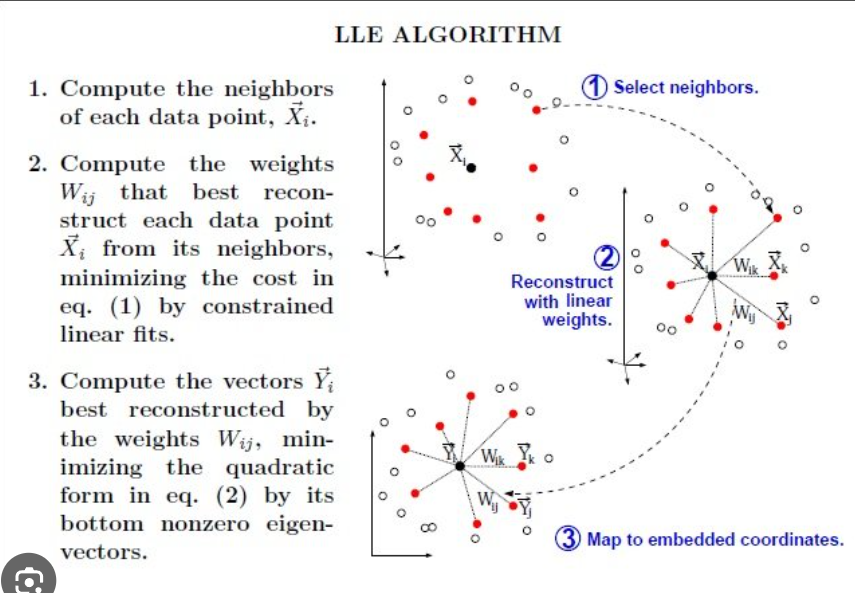

In [46]:
# Ruta de la imagen
imagen_path_6 = 'ejemplo6.png'
# Mostrar la imagen
display(Image(filename=imagen_path_6))

In [47]:
from sklearn.manifold import LocallyLinearEmbedding

In [92]:
# Inicializar LLE
lle = LocallyLinearEmbedding(n_neighbors=75,
                             n_components=2,
                             method='standard')

In [93]:
# Ajustar los datos al constructor de LLE
lle_res = lle.fit_transform(data2[['ANALF', 'SBASC', 'OVSDE', 'OVSEE',
                                   'OVSAE', 'OVPT', 'VHAC', 'PL.5000', 'PO2SM']])

In [94]:
# Crear un DataFrame con los componentes de LLE
lle_res_df = pd.DataFrame(data=lle_res, columns=['LLE1', 'LLE2'])

In [95]:
# Concatenar con 'NOM_ENT'
lle_final = pd.concat([lle_res_df, data2[['NOM_ENT']]], axis=1)

Text(0.5, 1.0, 'Locally Linear Embedding (LLE)')

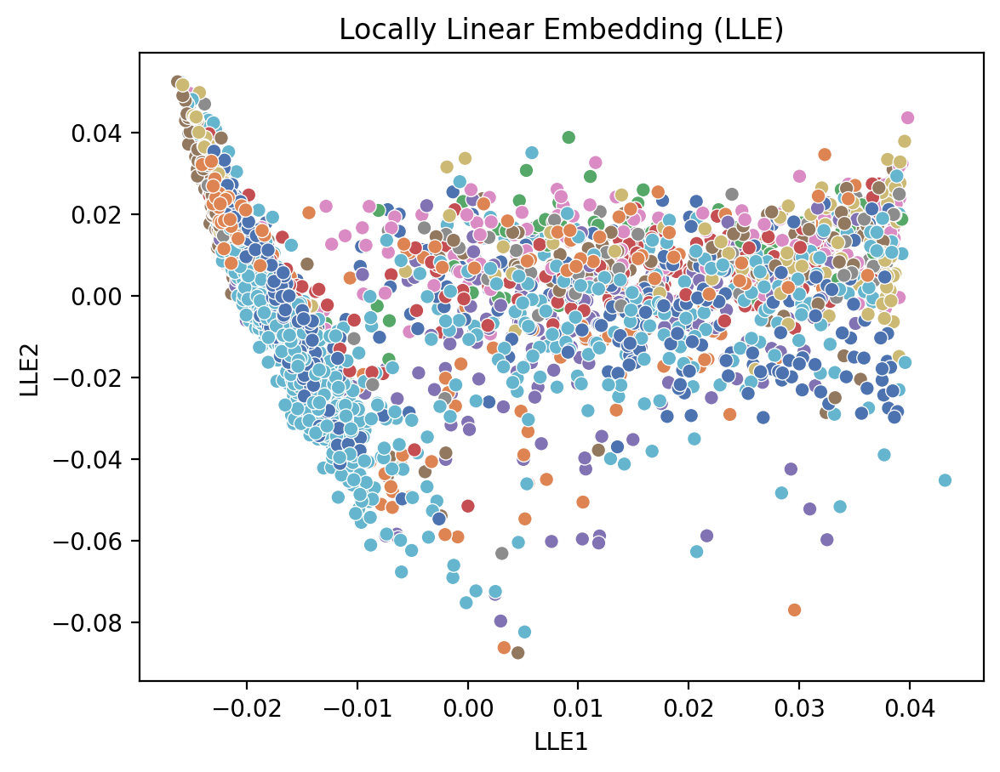

In [96]:
sns.scatterplot(data=lle_final, x="LLE1", y="LLE2", hue="NOM_ENT", palette="deep", legend=False)
plt.title('Locally Linear Embedding (LLE)')

Referencias:

https://www.sjsu.edu/faculty/guangliang.chen/Math253S20/lec10ISOmap.pdf

https://www.youtube.com/watch?v=NEaUSP4YerM&pp=ygUPdCBzbmUgZXhwbGFpbmVk

https://www.researchgate.net/figure/Basic-steps-of-Locally-Linear-Embedding-LLE-algorithm-Reprinted-from-13_fig3_266170894